In [1]:
from gensim.models import Word2Vec
import os
from gensim.models import Word2Vec
import glob, csv
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import itertools
from itertools import combinations
from itertools import product
import numpy as np

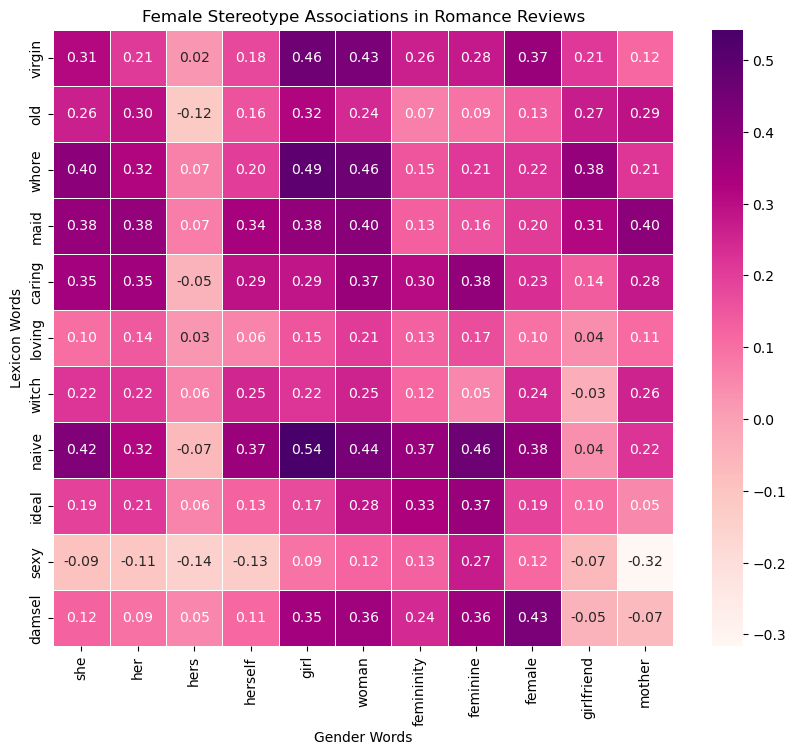

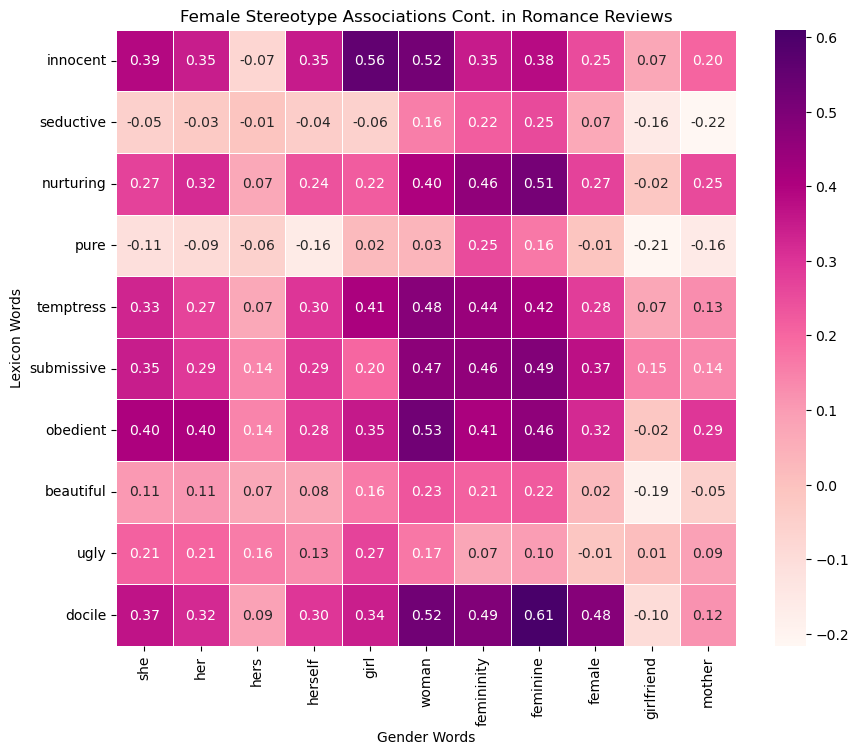

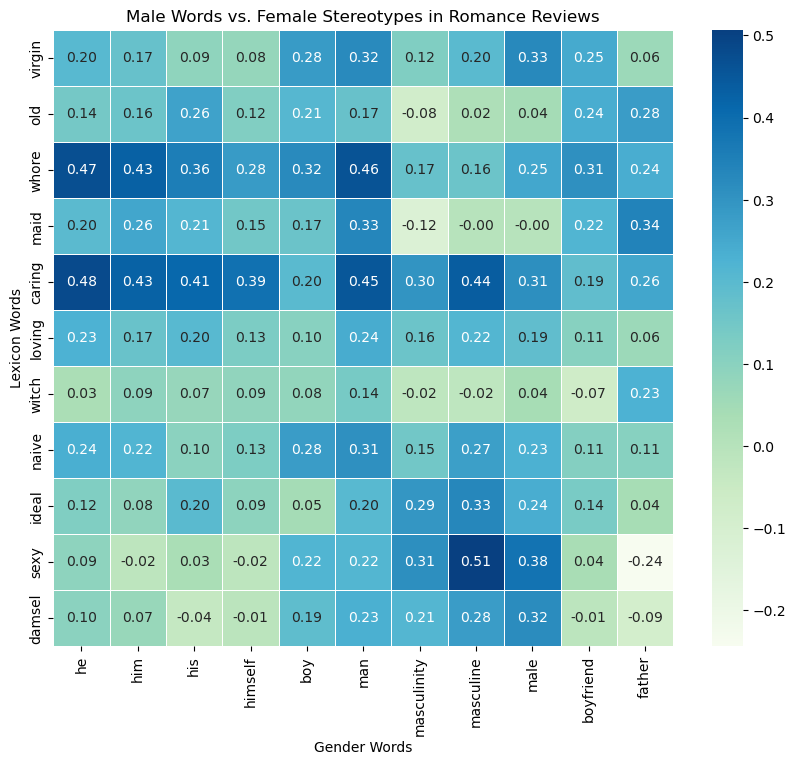

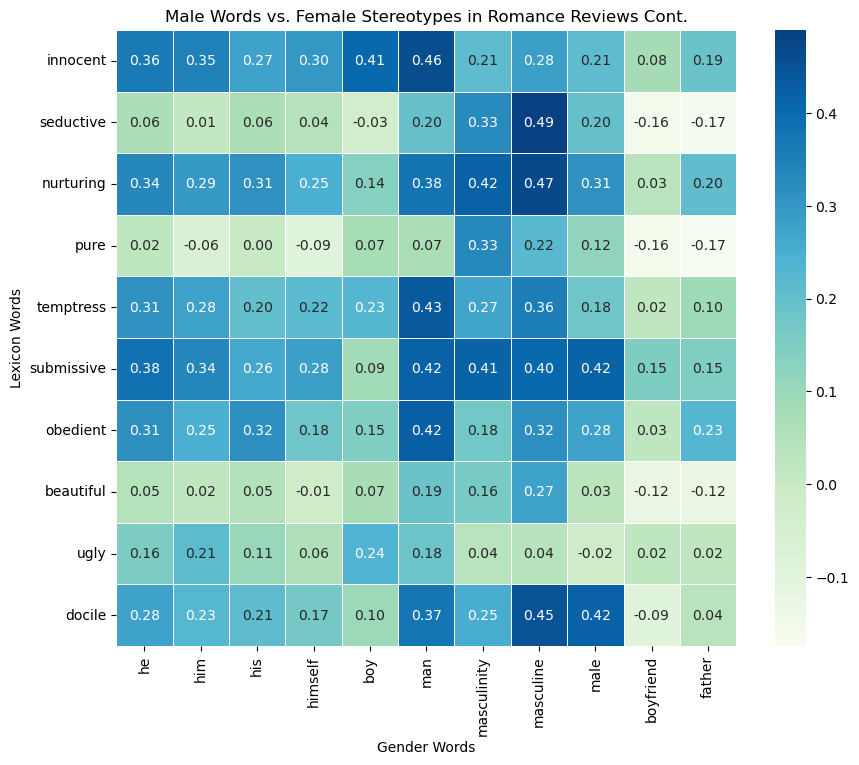

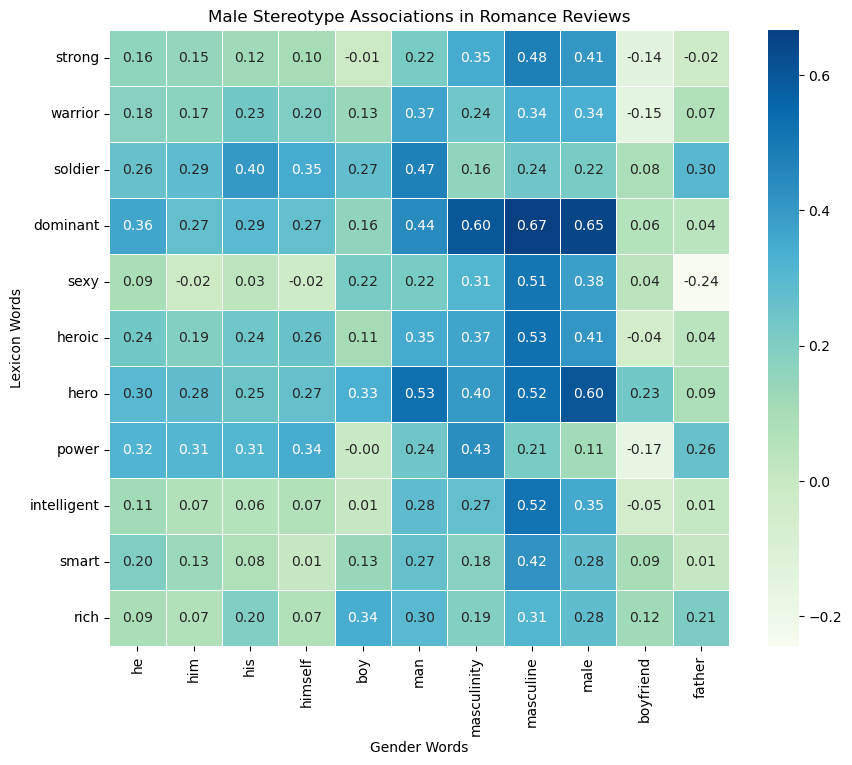

...

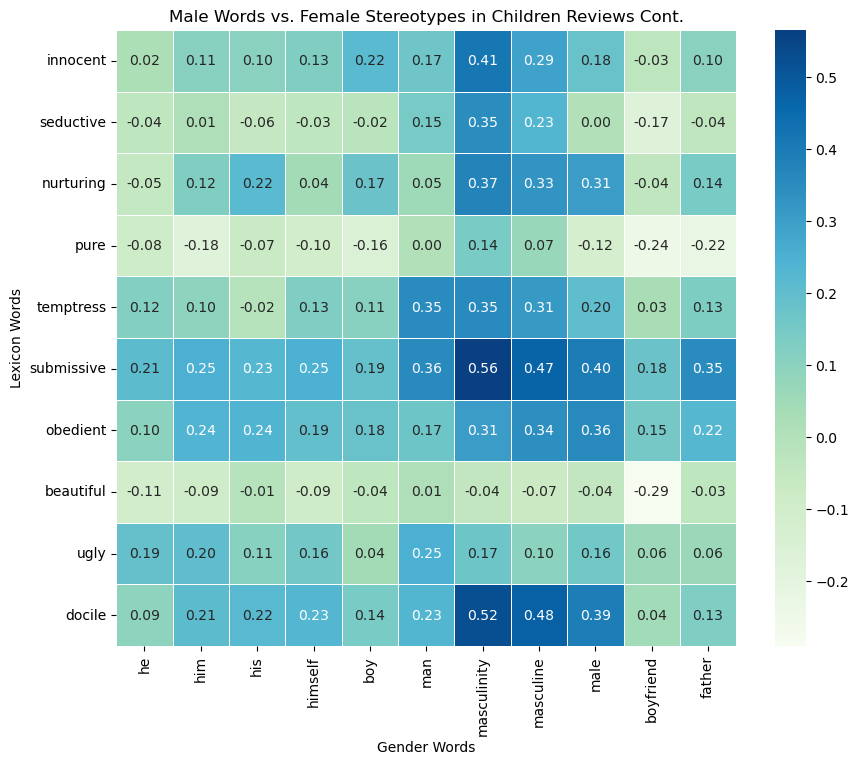

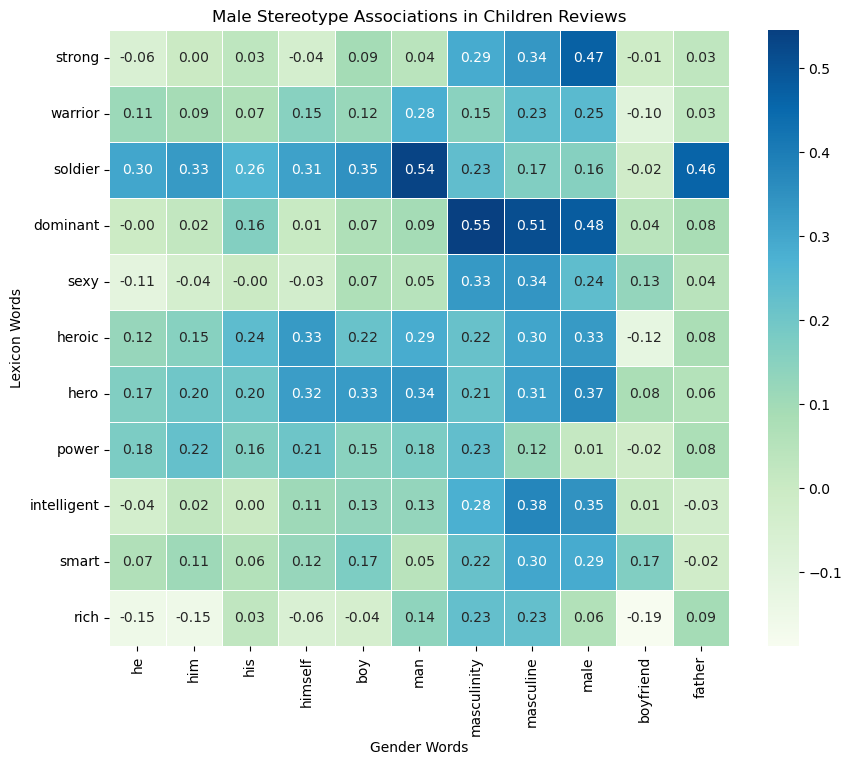

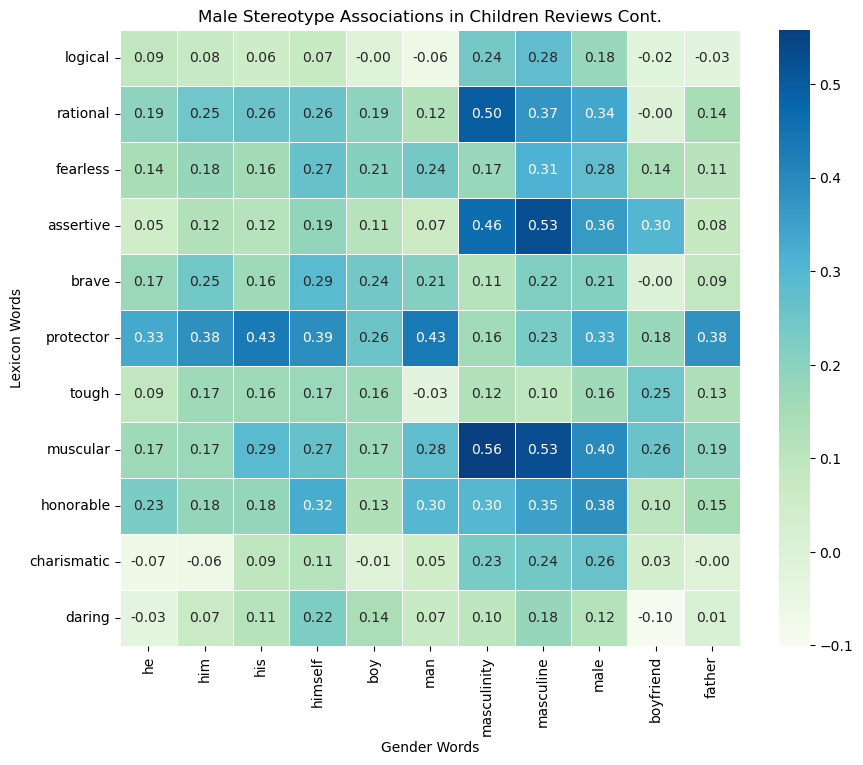

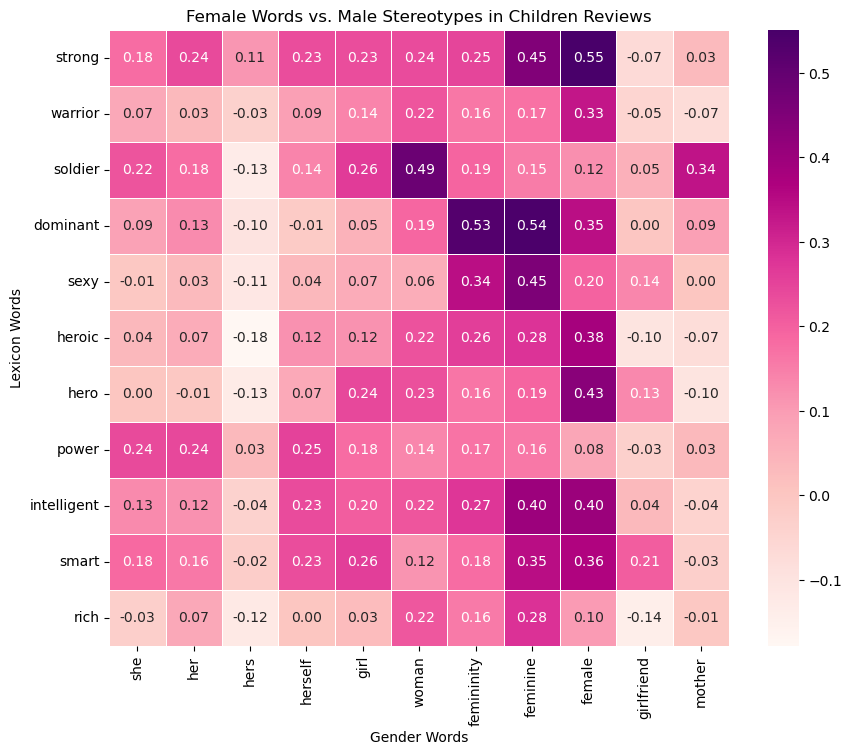

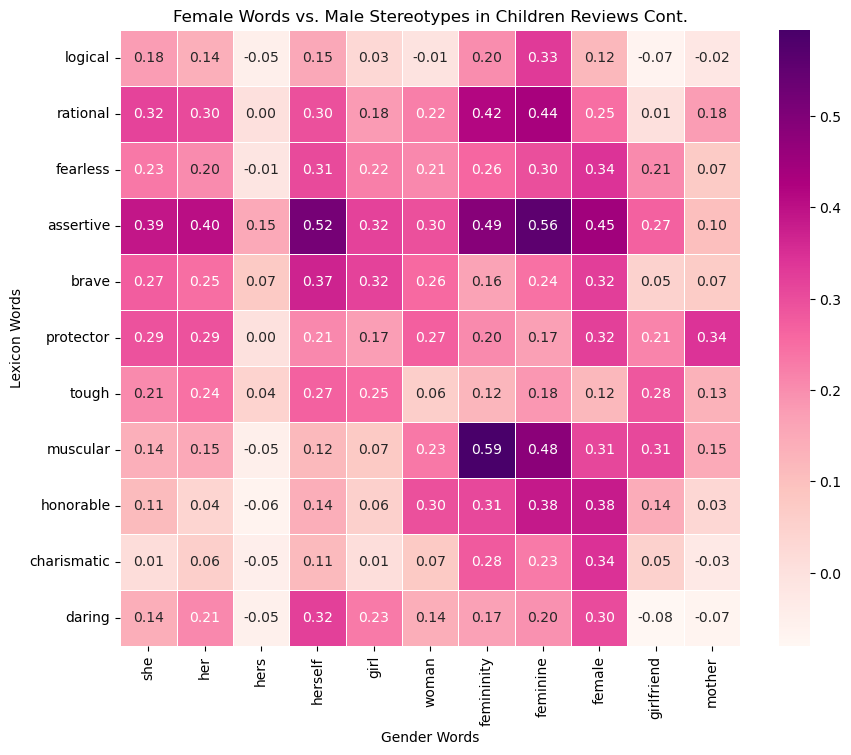

In [2]:
%run heatmaps_all.ipynb

In [3]:
#make sure list1 & list2 have same length
#words in mappings are formatted as ['word from list1 vs word from list2']
def map_words_from_lists(list1, list2):
    mapping1 = {}
    mapping2 = {}
    for i in range(len(list1)):
        mapping1[list1[i]] = list1[i] + " vs " + list2[i]  
        mapping2[list2[i]] = list1[i] + " vs " + list2[i]  
    return (mapping1, mapping2)

#heatmap for gender1-gender2
def build_diff_heatmap(stereotypes, gender1_words, gender2_words, model):
    normalize = map_words_from_lists(gender1_words, gender2_words)
    df_1 = generate_heatmap_matrix(stereotypes, gender1_words, model).rename(columns=normalize[0])
    df_2 = generate_heatmap_matrix(stereotypes, gender2_words, model).rename(columns=normalize[1])
    df_diff = df_1 - df_2
    return df_diff

In [4]:
def plot_diff_heatmap(df, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(df,
                cmap="BuPu",
                xticklabels=True,
                yticklabels=True,
                annot=True,  
                fmt=".2f",  
                linewidths=.5)  
    plt.xlabel('Gender Words')
    plt.ylabel('Lexicon Words')
    plt.title(title)
    plt.show()

In [5]:
def plot_bar(data, x_vals, y_vals):
    diverging_colors = sns.color_palette("BuPu", 11)
    sns.catplot(data, 
            x= x_vals,
            y= y_vals, 
            kind ='bar',
            palette = diverging_colors,
            orient='h')
    
def plot_mean_diffs(df, gender1, gender2):
    collapsed_heatmap = df.mean(axis=1).sort_values().reset_index(name=f"avg difference in correlation between {gender1} and {gender2}")
    collapsed_heatmap = collapsed_heatmap.rename(columns={"index":"lexicon words"})
    plot_bar(collapsed_heatmap, f"avg difference in correlation between {gender1} and {gender2}", "lexicon words")
    return collapsed_heatmap

In [6]:
#see how much women are actually correlated to their stereotypes
def run_women(genre_model):
    df_diff1 = build_diff_heatmap(female_stereotypes_1, women_words, men_words, genre_model)
    df_diff2 = build_diff_heatmap(female_stereotypes_2, women_words, men_words, genre_model) 
    
    plot_diff_heatmap(df_diff1, "Correlation of Women to Female Stereotypes Compared to Correlation of Men to Female Stereotypes")
    plot_diff_heatmap(df_diff2, "Correlation of Women to Female Stereotypes Compared to Correlation of Men to Female Stereotypes")
    
    bar1 = plot_mean_diffs(df_diff1, "women", "men")
    bar2 = plot_mean_diffs(df_diff2, "women", "men")
    
    return df_diff1, df_diff2

#see how much men are actually correlated to their stereotypes
def run_men(genre_model):
    df_diff3 = build_diff_heatmap(male_stereotypes_1, men_words, women_words, genre_model)
    df_diff4 = build_diff_heatmap(male_stereotypes_2, men_words, women_words, genre_model)

    plot_diff_heatmap(df_diff3, "Correlation of Men to Male Stereotypes Compared to Correlation of Women to Male Stereotypes")
    plot_diff_heatmap(df_diff4, "Correlation of Men to Male Stereotypes Compared to Correlation of Women to Male Stereotypes")

    bar3 = plot_mean_diffs(df_diff3, "women", "men")
    bar4 = plot_mean_diffs(df_diff4, "women", "men")
    
    return df_diff3, df_diff4

## Romance

### Female Stereotypes: Women - Men

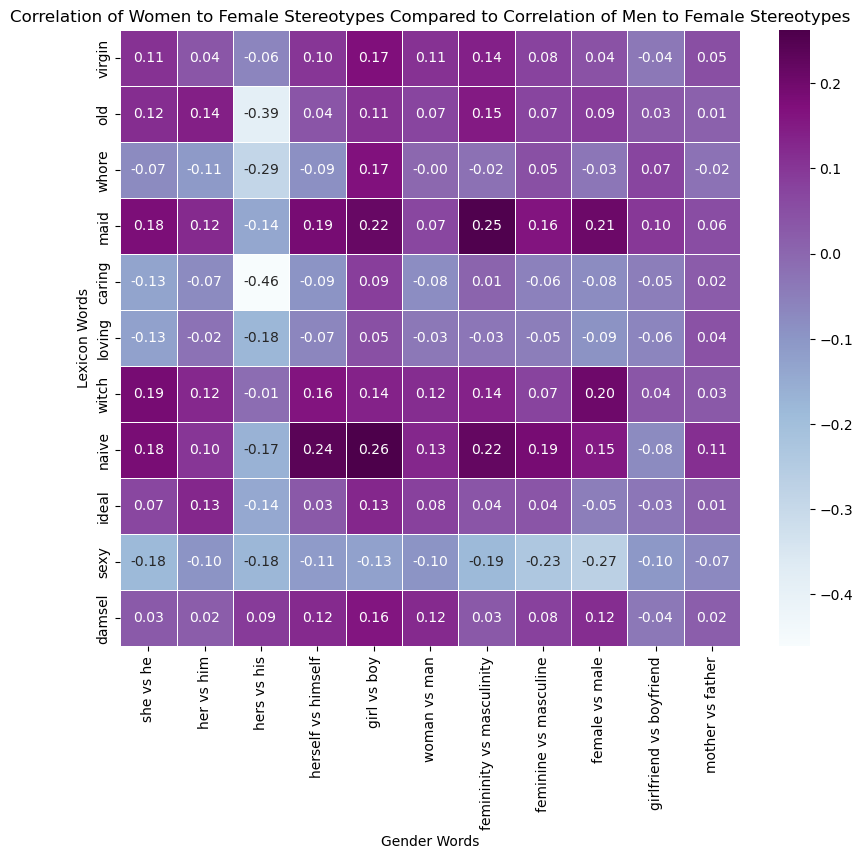

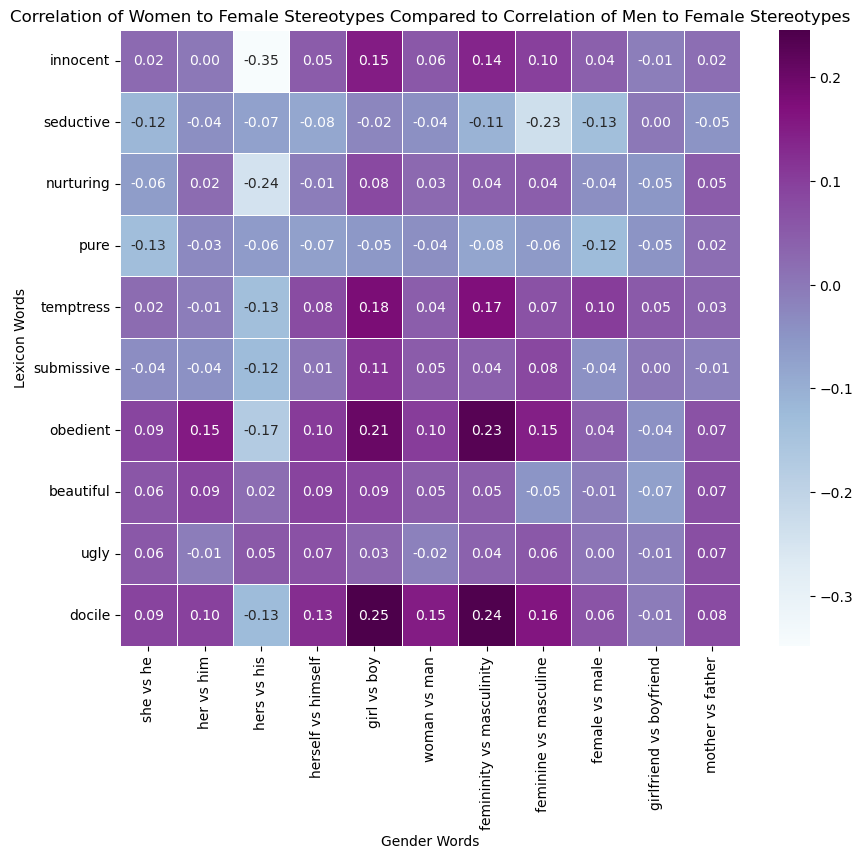

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


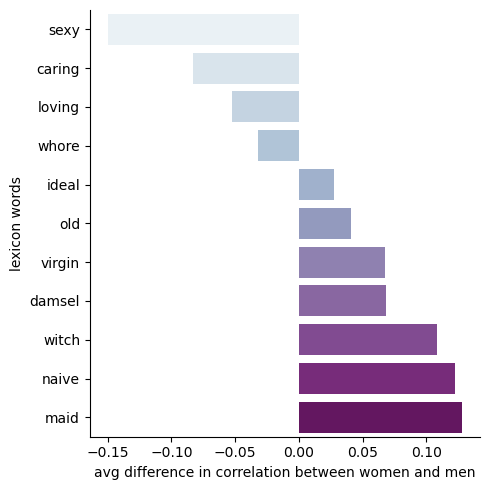

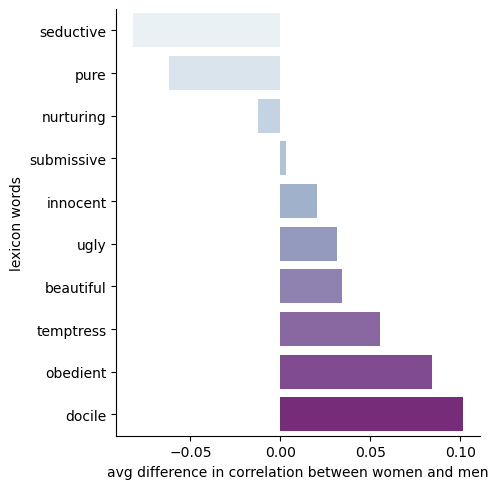

In [7]:
romance_women_df1, romance_women_df2 = run_women(romance_model)

### Male Stereotypes: Men-Women

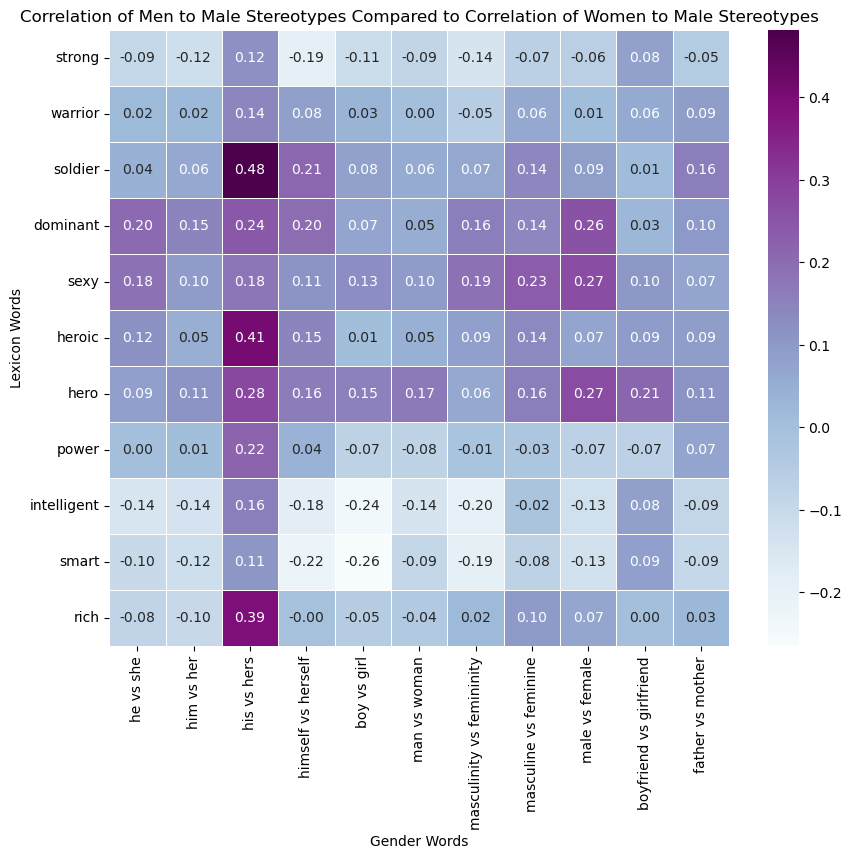

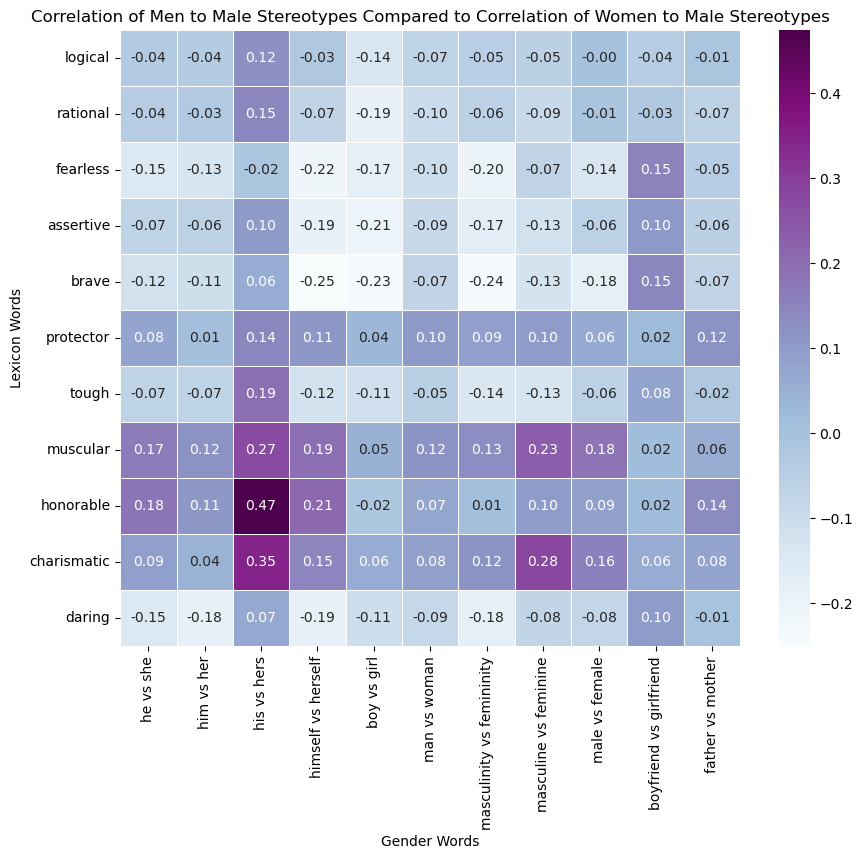

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


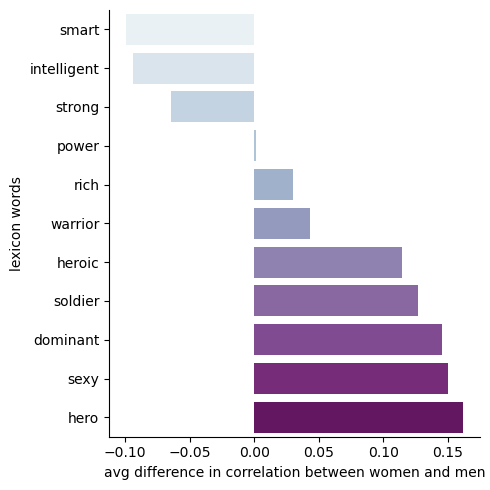

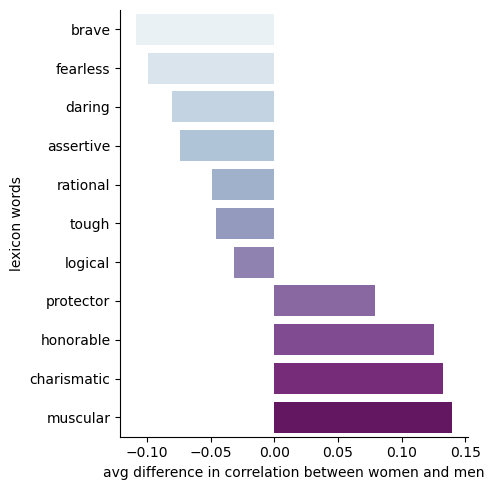

In [8]:
romance_men_df1, romance_men_df2 = run_men(romance_model)

## Mystery

### Female Stereotypes: women - men

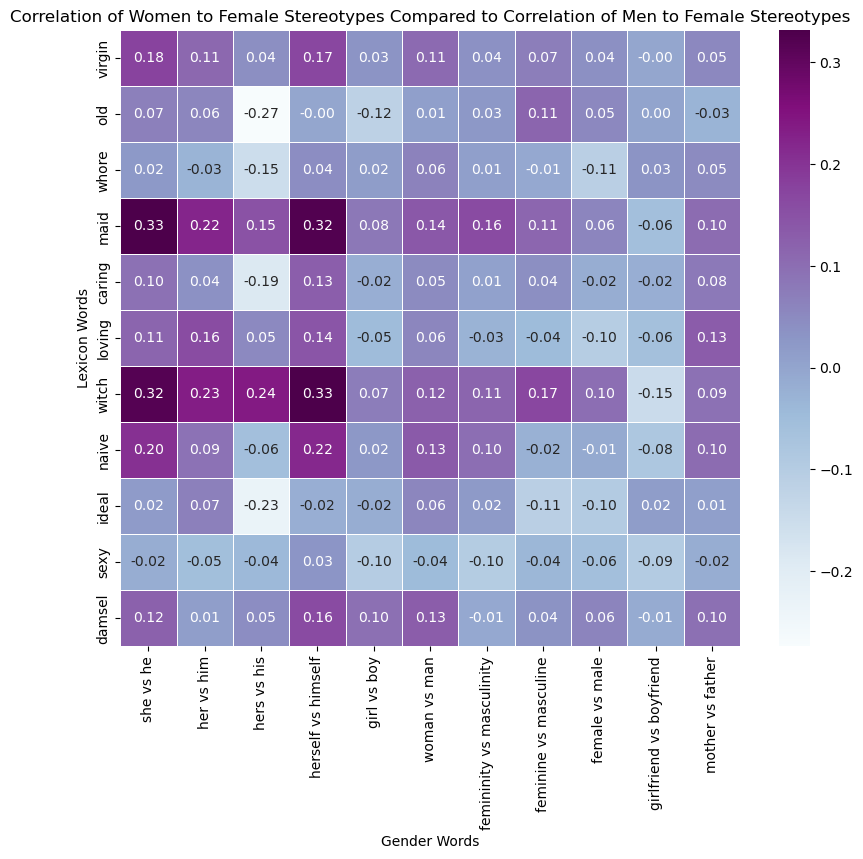

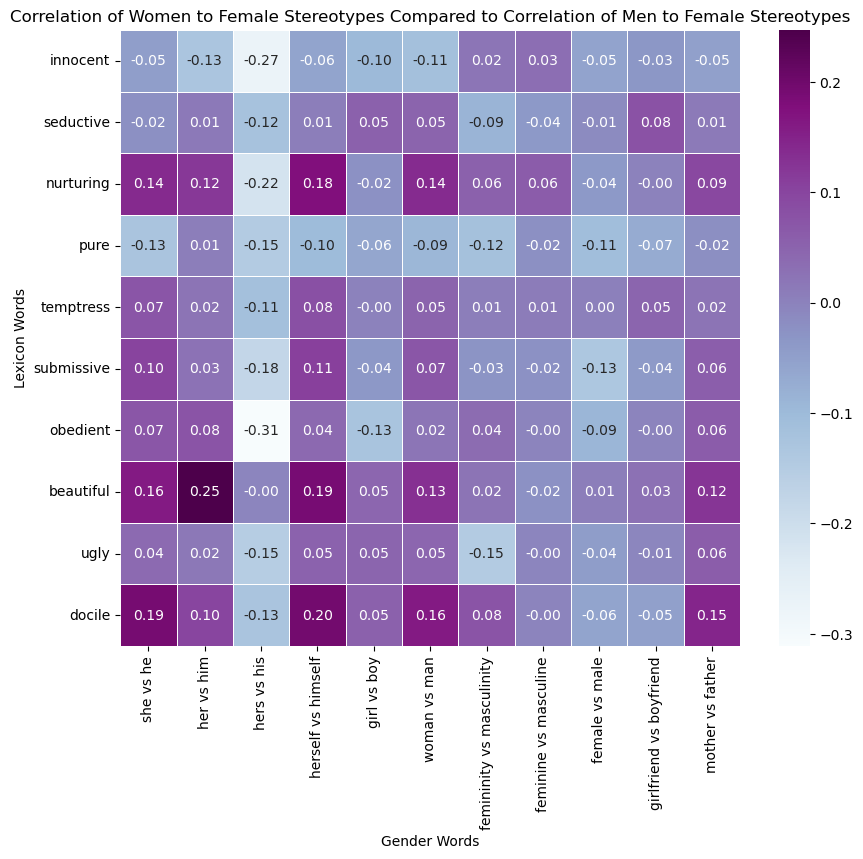

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


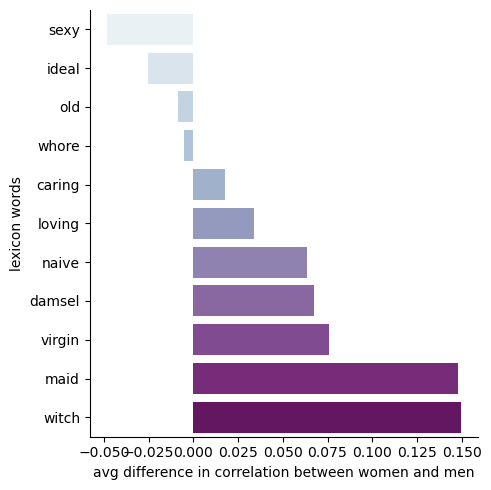

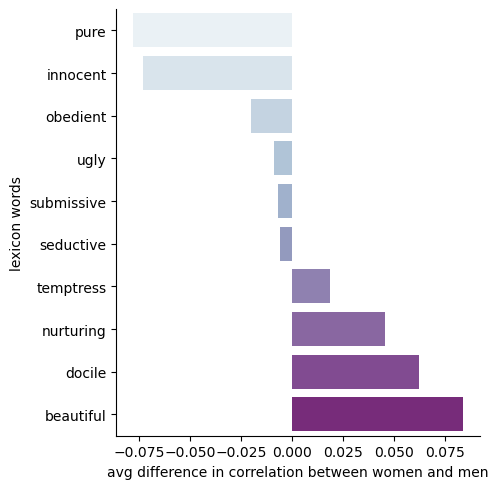

In [9]:
mystery_women_df1, mystery_women_df2 = run_women(mystery_model)

### Male Stereotypes: Men - Women

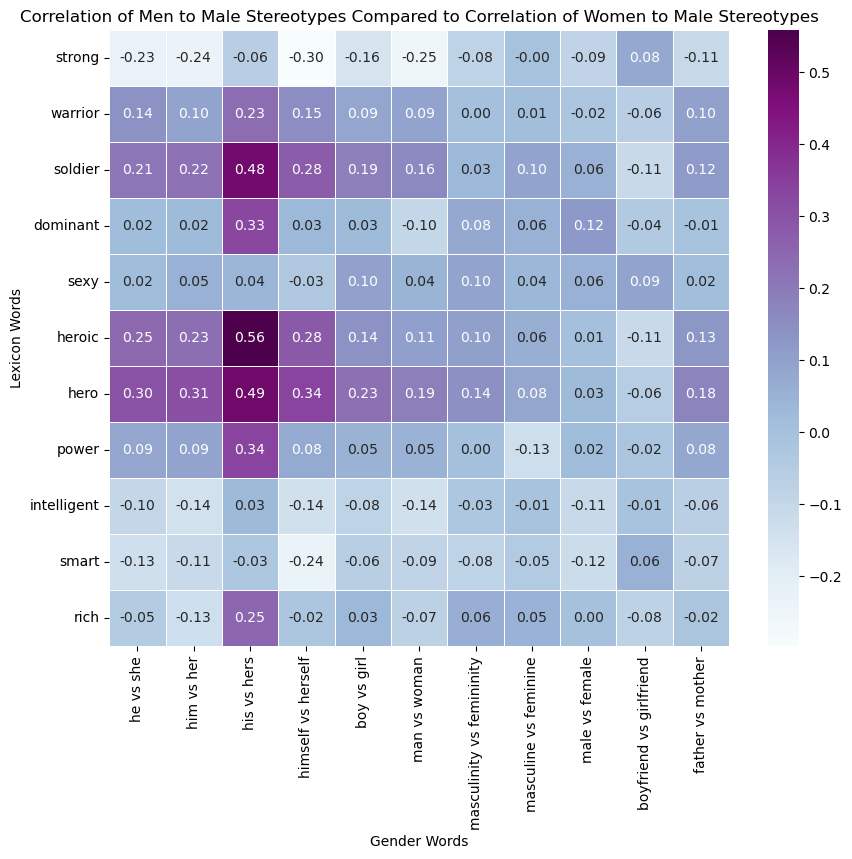

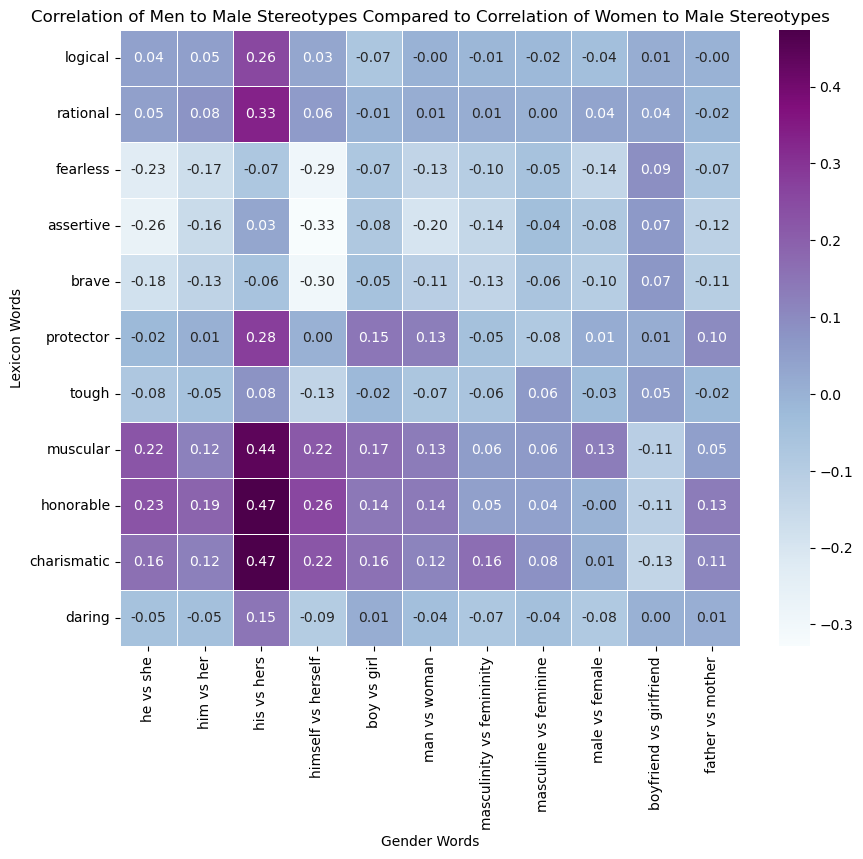

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


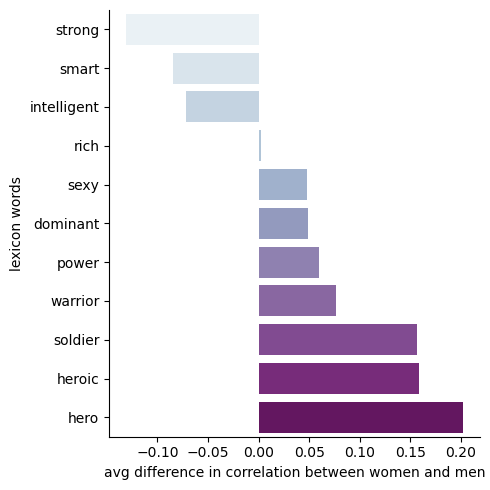

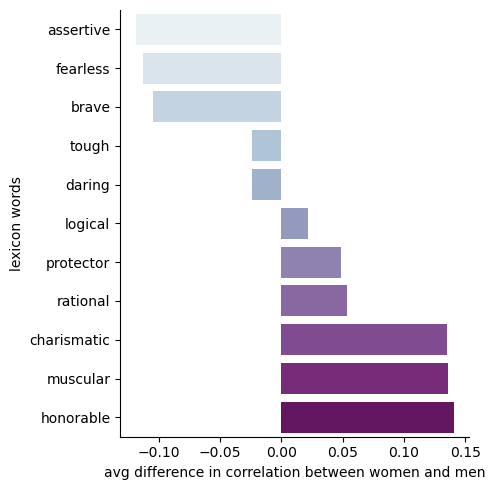

In [10]:
mystery_men_df1, mystery_men_df2 = run_men(mystery_model)

## Comics

### Female Stereotypes

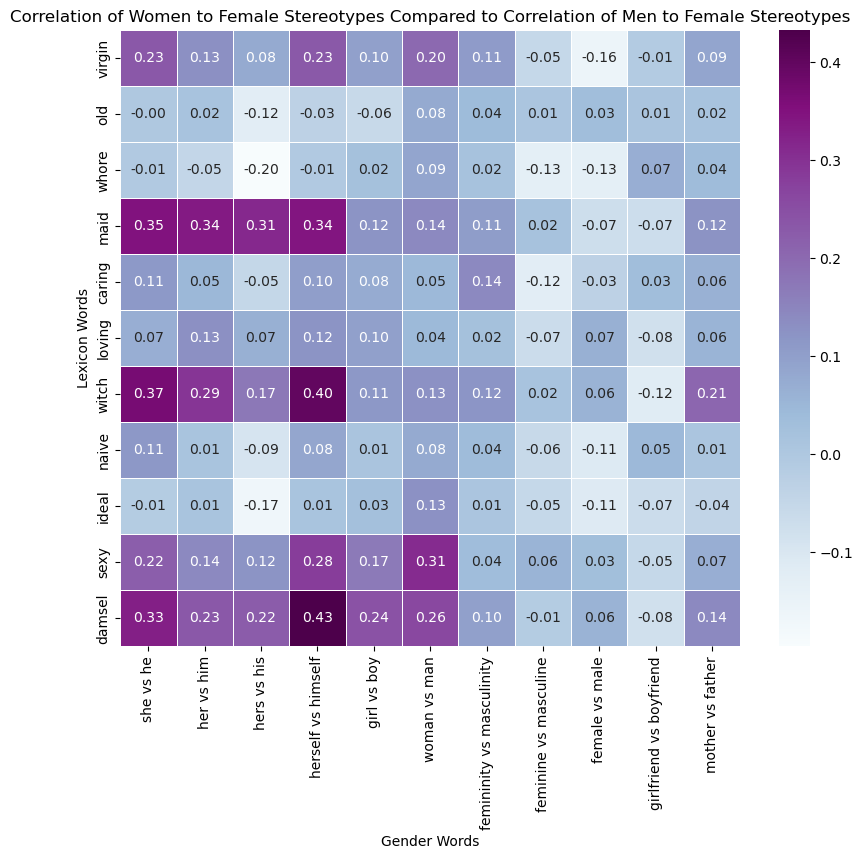

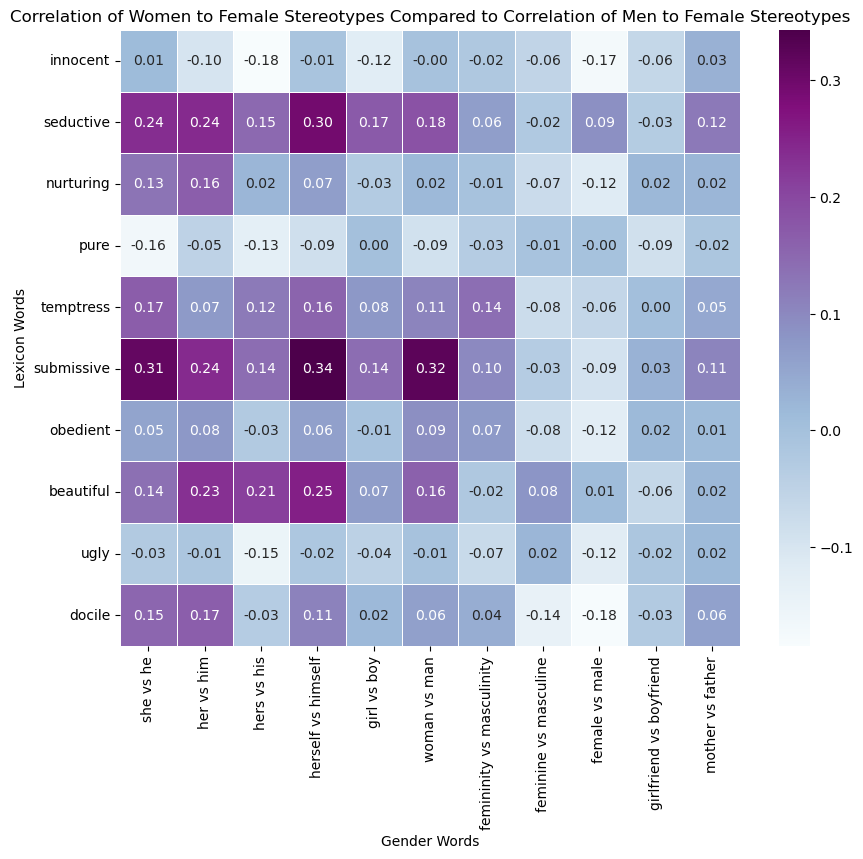

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


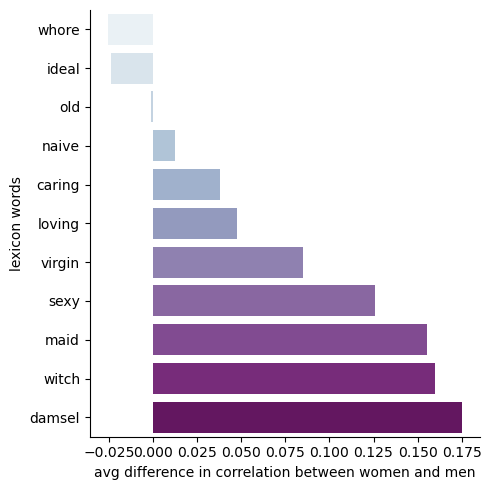

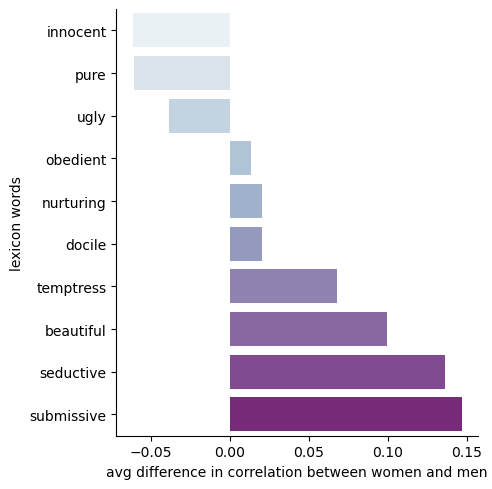

In [11]:
comics_women_df1,comics_women_df2 = run_women(comics_model)

### Male Stereotypes

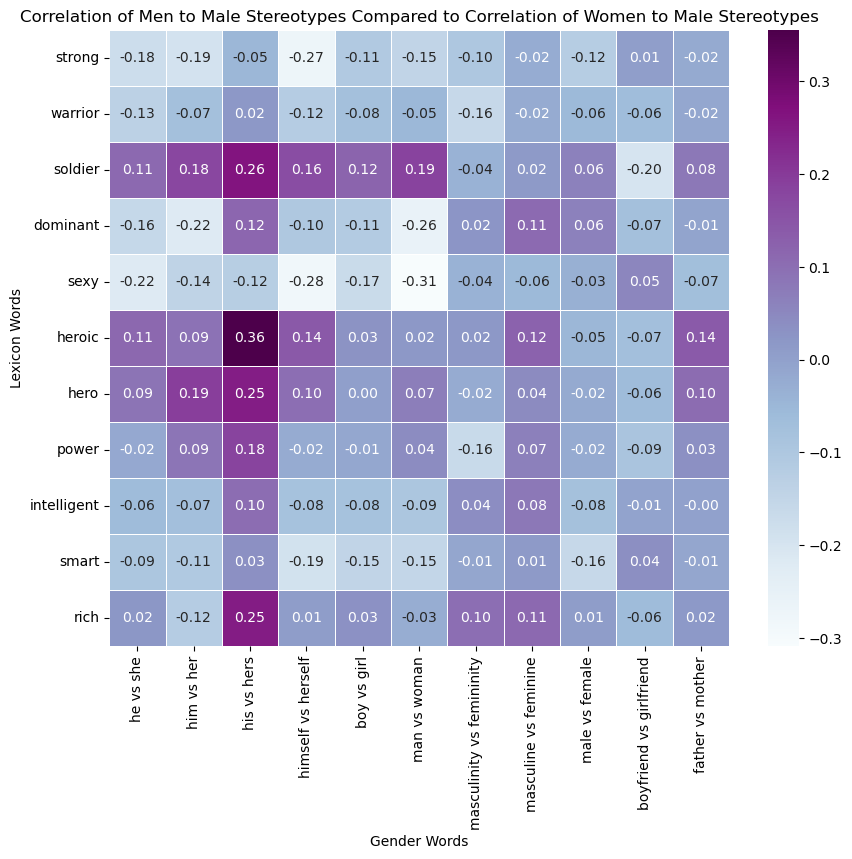

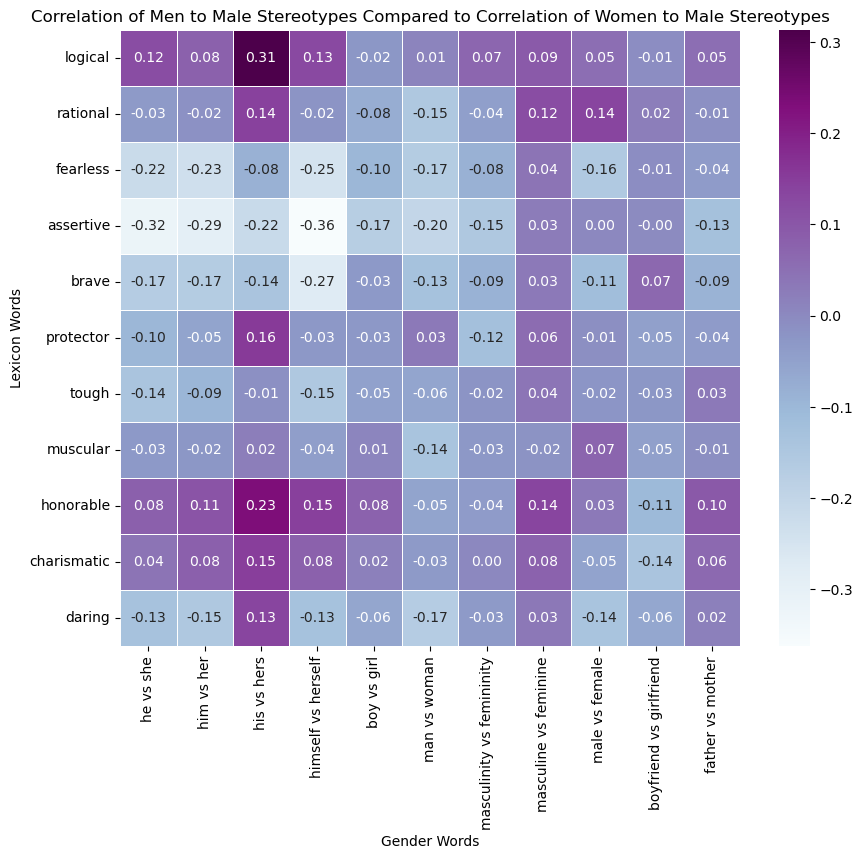

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


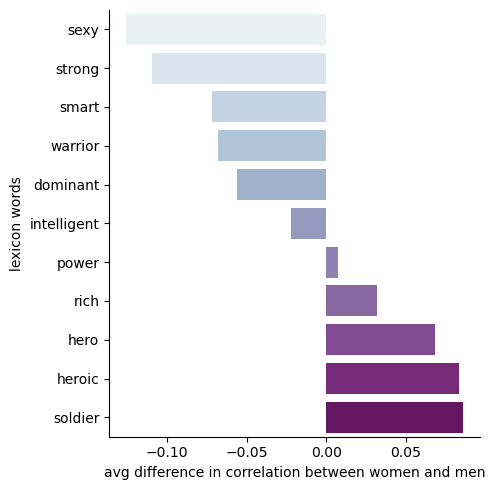

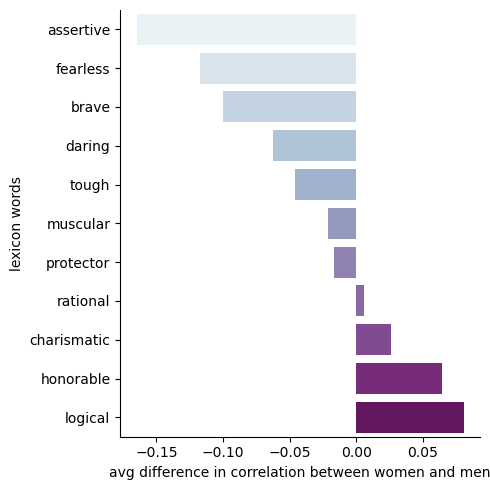

In [12]:
comics_men_df1,comics_men_df2 = run_men(comics_model)

## Poetry

### Female Stereotypes: Women-Men

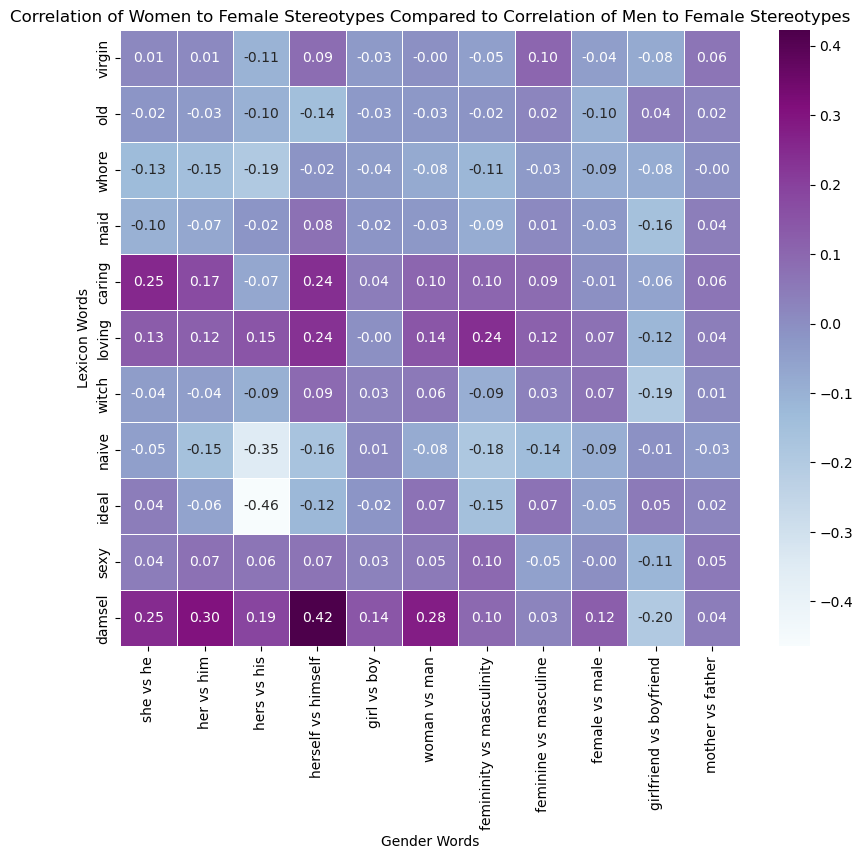

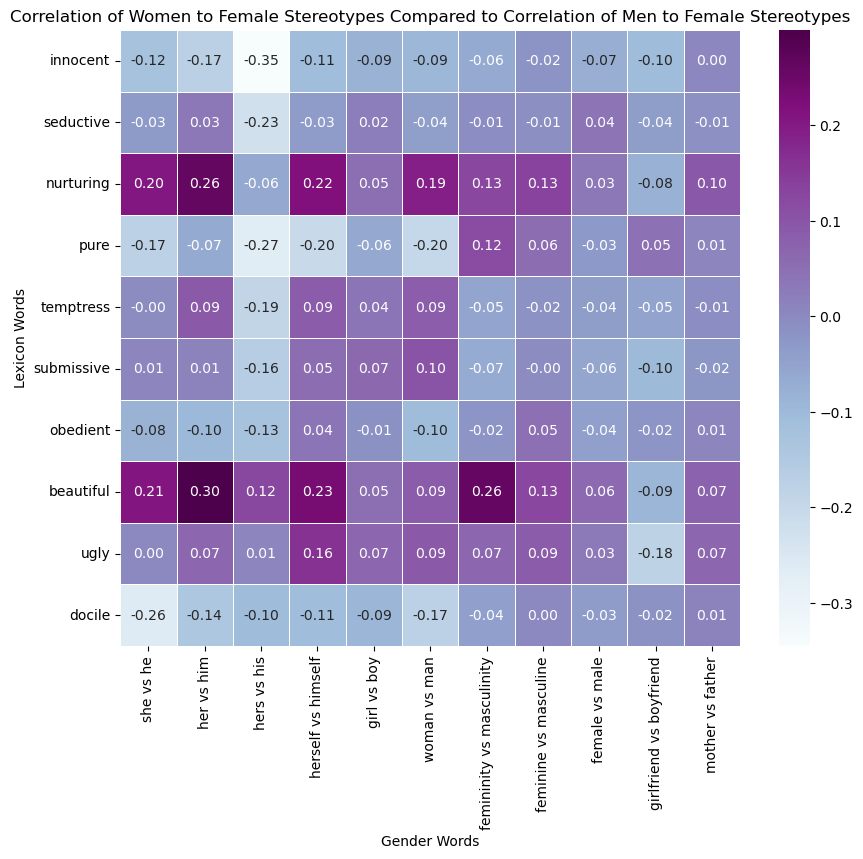

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


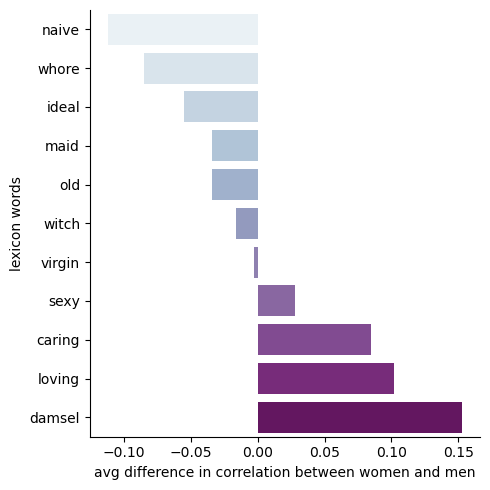

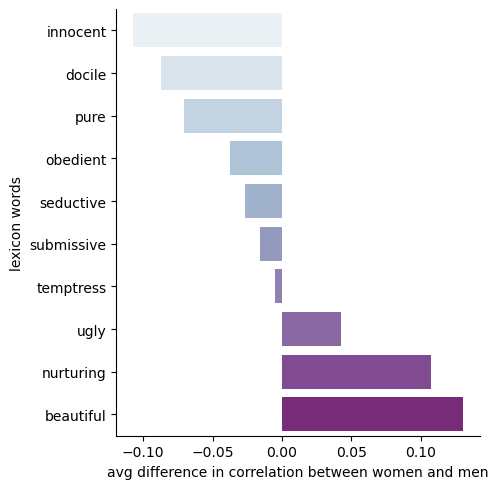

In [13]:
poetry_women_df1, poetry_women_df2 = run_women(poetry_model)

### Male Stereotypes: Men-Women

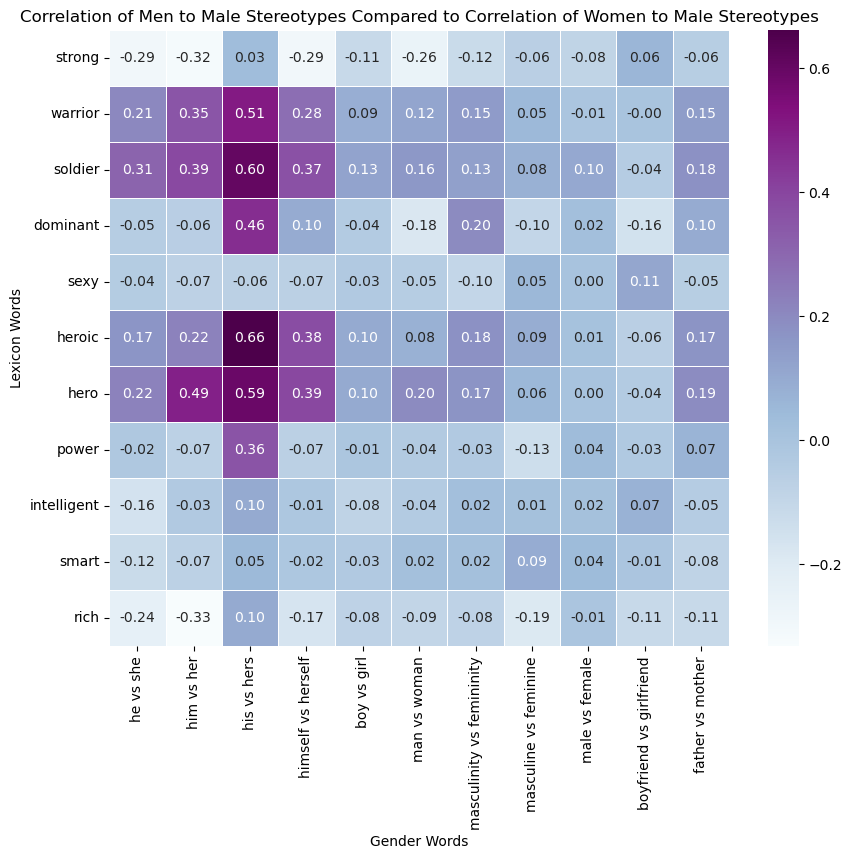

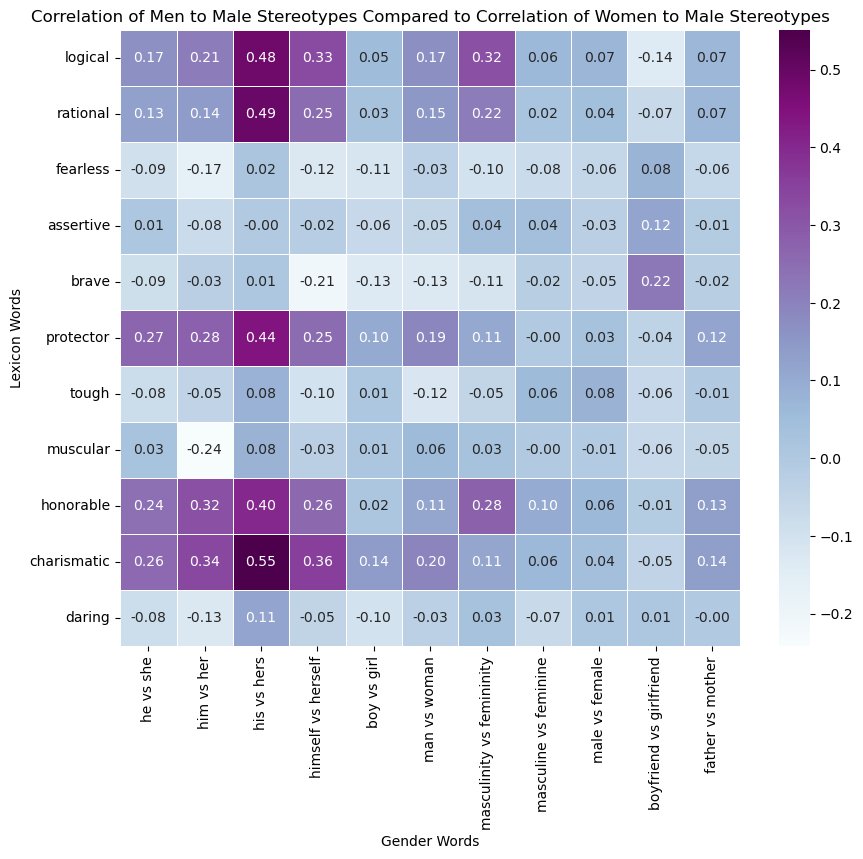

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


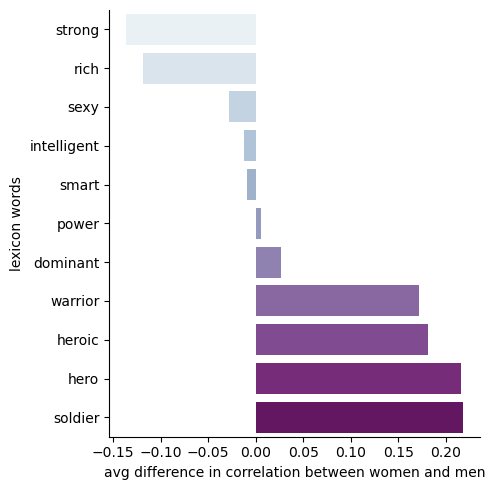

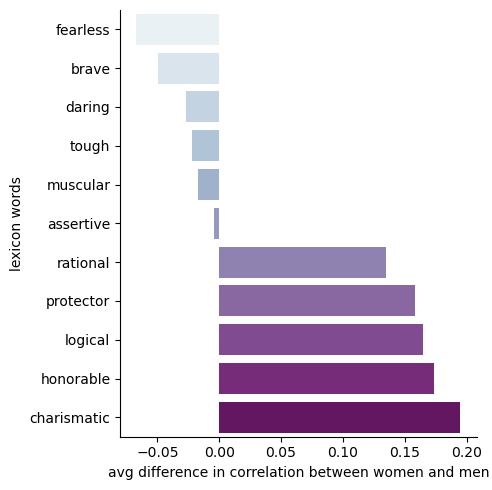

In [14]:
poetry_men_df1, poetry_men_df2 = run_men(poetry_model)

## Children

### Female Stereotypes: Women-Men

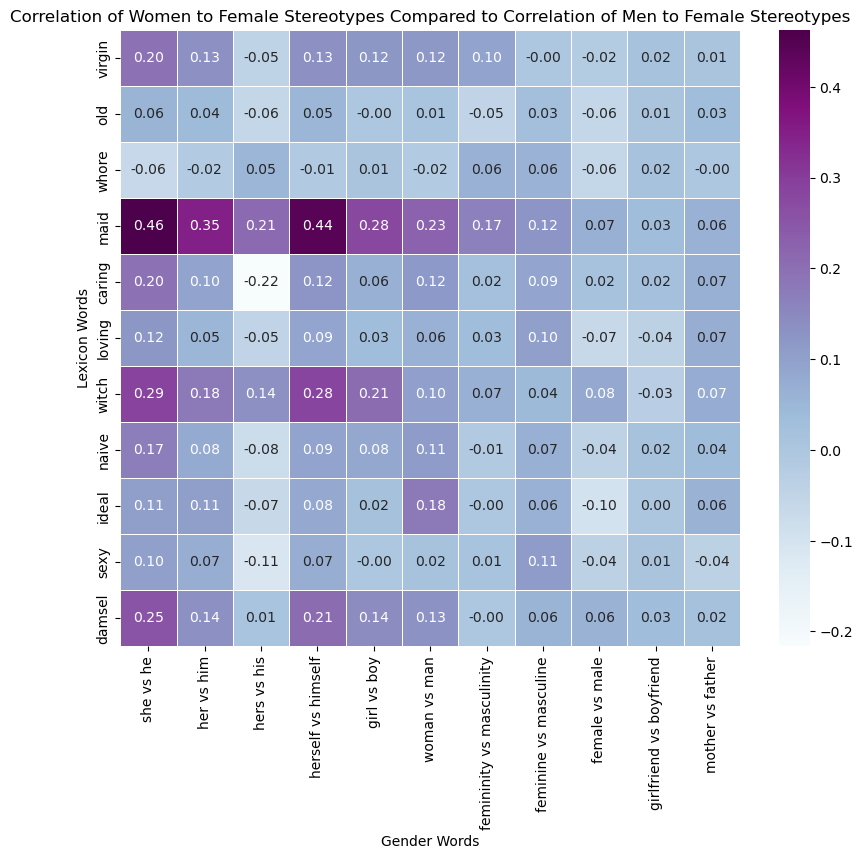

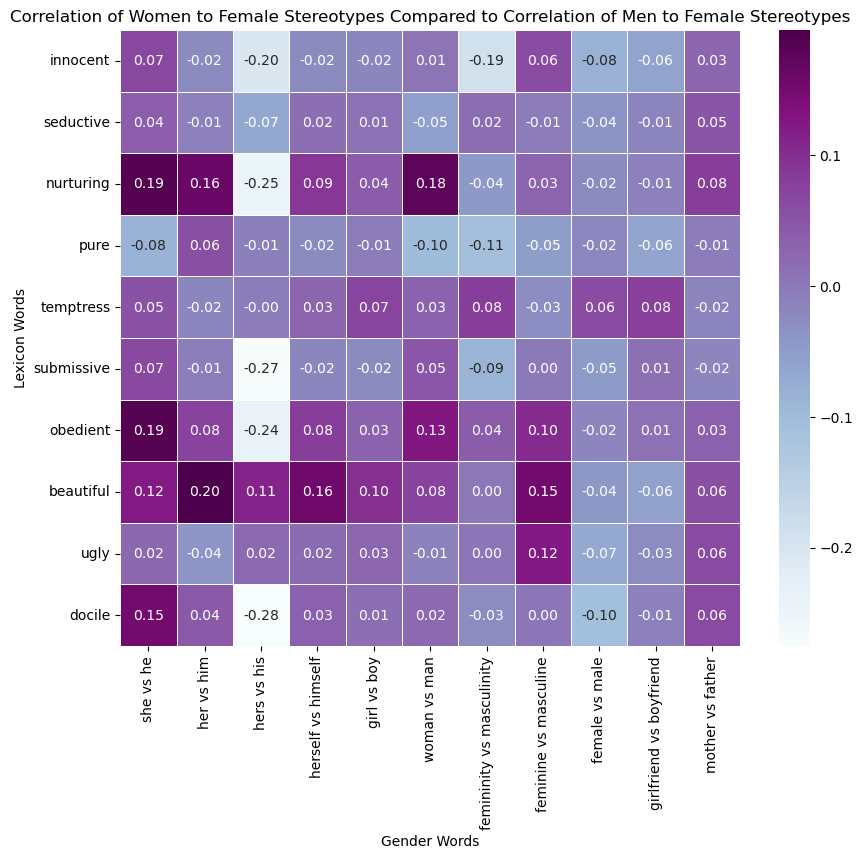

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


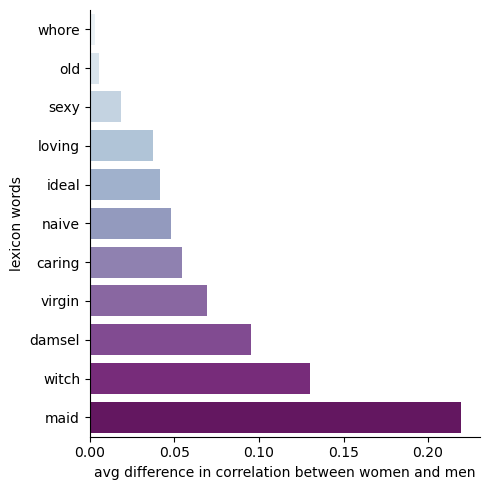

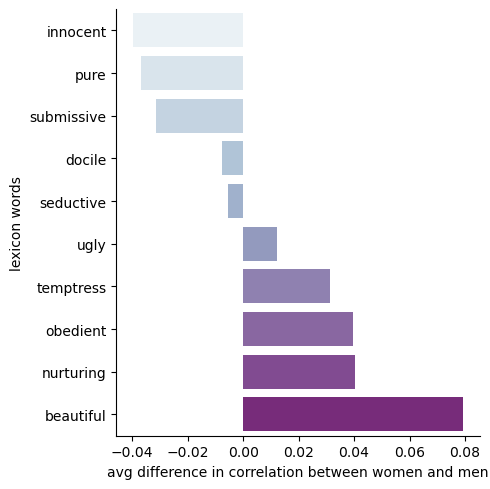

In [15]:
children_women_df1, children_women_df2 = run_women(children_model)

### Male Stereotypes: Men-Women

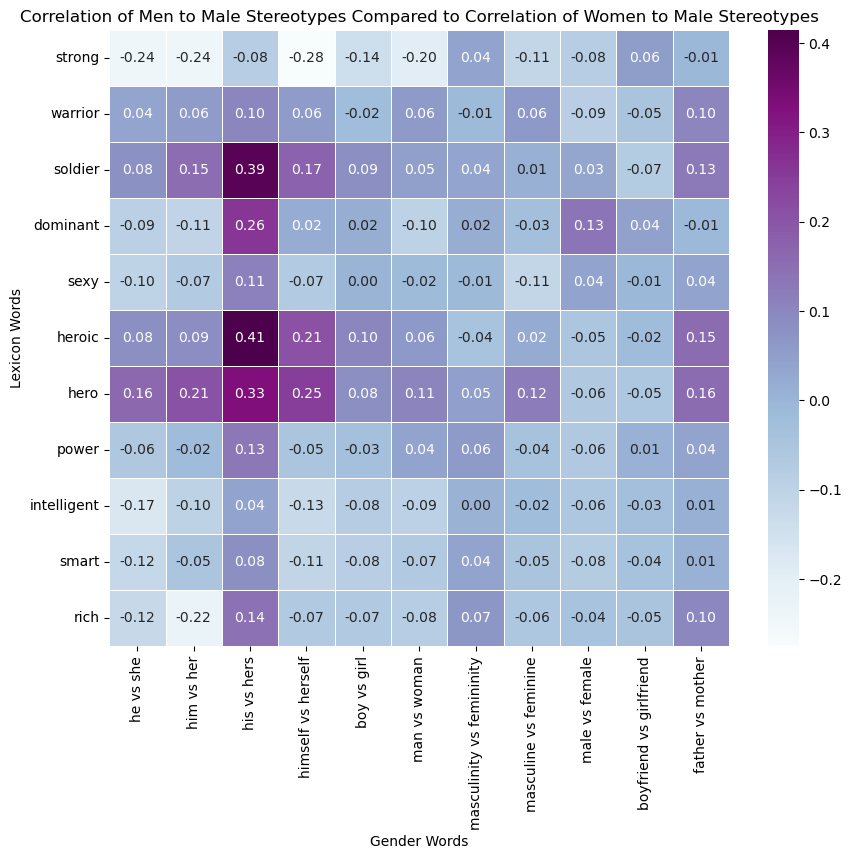

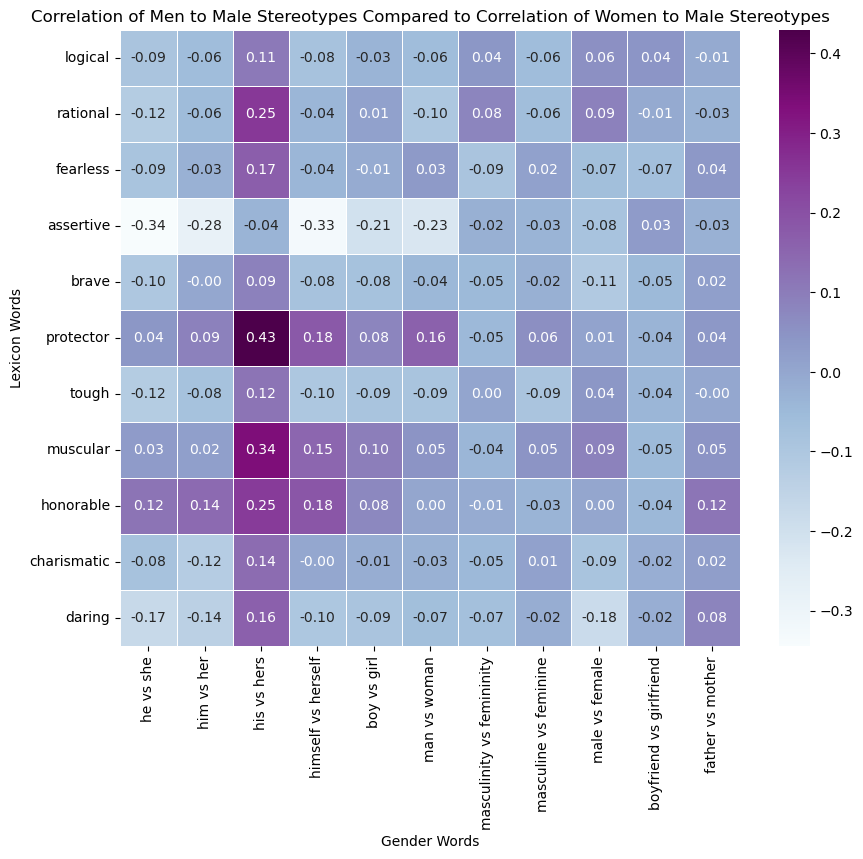

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


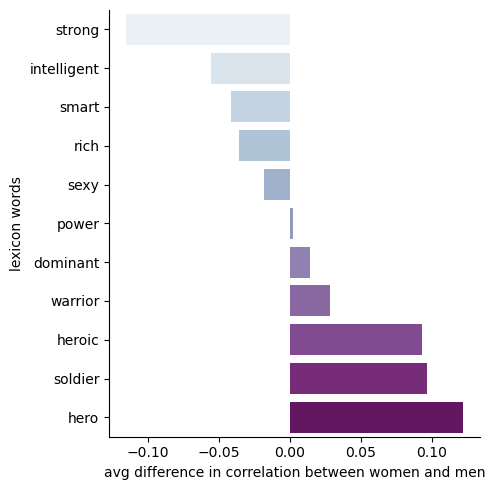

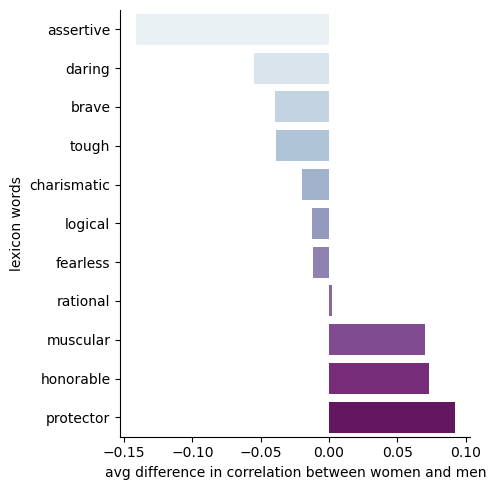

In [16]:
children_men_df1, children_men_df2 = run_men(children_model)

## Total Data Aggregation

/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/kellyxu/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


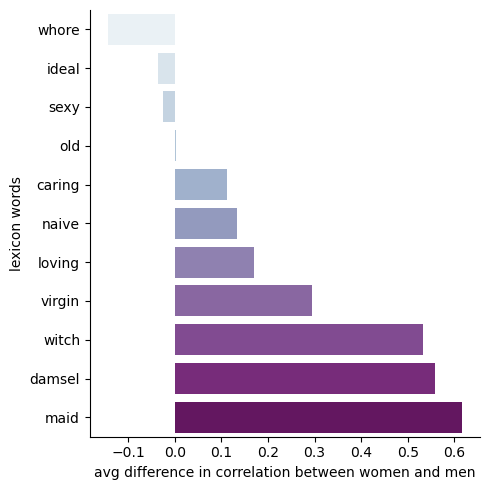

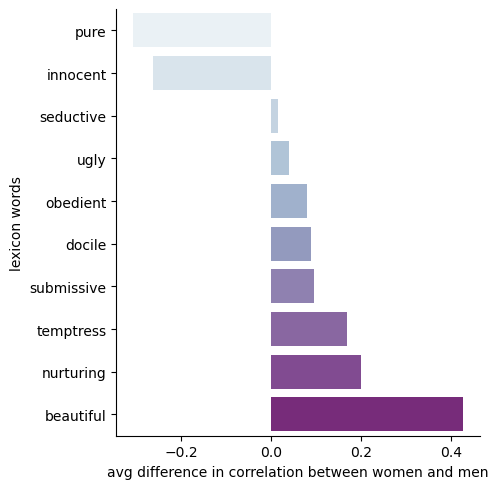

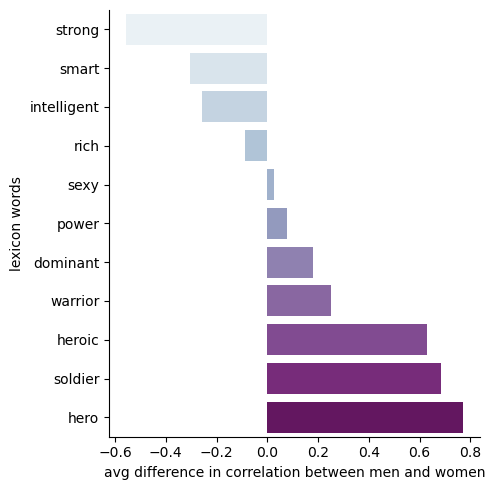

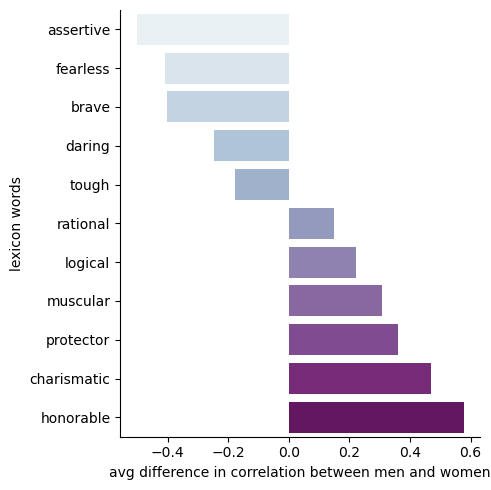

In [17]:
total_women_df1 = romance_women_df1 + mystery_women_df1 + comics_women_df1 + poetry_women_df1 + children_women_df1
total_women_df2 = romance_women_df2 + mystery_women_df2 + comics_women_df2 + poetry_women_df2 + children_women_df2

total_men_df1 = romance_men_df1 + mystery_men_df1 + comics_men_df1 + poetry_men_df1 + children_men_df1
total_men_df2 = romance_men_df2 + mystery_men_df2 + comics_men_df2 + poetry_men_df2 + children_men_df2

bar_women_1 = plot_mean_diffs(total_women_df1, "women", "men")
bar_women_2 = plot_mean_diffs(total_women_df2, "women", "men")

bar_men_1 = plot_mean_diffs(total_men_df1, "men", "women")
bar_men_2 = plot_mean_diffs(total_men_df2, "men", "women")

In [18]:
bar_women_1

,lexicon words,avg difference in correlation between women and men
0,whore,-0.144634
1,ideal,-0.035719
2,sexy,-0.026004
3,old,0.002692
4,caring,0.111519
5,naive,0.134411
6,loving,0.169207
7,virgin,0.295208
8,witch,0.531952
9,damsel,0.559130


In [19]:
bar_women_2

,lexicon words,avg difference in correlation between women and men
0,pure,-0.306979
1,innocent,-0.261586
2,seductive,0.016380
3,ugly,0.039399
4,obedient,0.080163
5,docile,0.089969
6,submissive,0.096394
7,temptress,0.168992
8,nurturing,0.201342
9,beautiful,0.428349


In [20]:
bar_men_1

,lexicon words,avg difference in correlation between men and women
0,strong,-0.557139
1,smart,-0.306489
2,intelligent,-0.255714
3,rich,-0.090076
4,sexy,0.026004
5,power,0.076676
6,dominant,0.179458
7,warrior,0.250837
8,heroic,0.629504
9,soldier,0.684383


In [21]:
bar_men_2

,lexicon words,avg difference in correlation between men and women
0,assertive,-0.503167
1,fearless,-0.407862
2,brave,-0.401808
3,daring,-0.248209
4,tough,-0.176859
5,rational,0.147539
6,logical,0.223178
7,muscular,0.307425
8,protector,0.361565
9,charismatic,0.468986
